In [1]:
#%reset
from matplotlib import pyplot as plt
import numpy as np
import math
import PyPore
from PyPore.DataTypes import *
import seaborn as sns
import sys
import os
from Dimer_Analysis import TraceFile
import Dimer_Analysis 
fname=os.path.join("D:\\ProteinData\Meni\\alphaHL_ GFP10D_1M KCl_2M GdnHCl_PH7.5  traces 10kHz filter\\175mV","B091520_005_trace_10kHz.bin")

def prepareFiles(directory,inputDict,metaOutput="metadata.json",verbose=False,acceptedExts={".bin",".opt",".abf"},meta_format="json"):
    for root,dirs,files in os.walk(directory,topdown=True):
        for name in files:
            for key,value in inputDict.items():
                if root.find(key) is not -1 and root.find("Multiple_mV") is not -1: #
                    if os.path.splitext(name)[1]==".bin":
                        value.append(os.path.join(root,name))

PyPore.DataTypes.__file__  
#np.__file__
#experimentfiles={"_ GFP10D":[],"_ MBP10D":[],"_ MBP+GFP10D":[],"_ MBPMBP10D":[],"_ MBP Nterm":[]}
#prepareFiles("D:\\ProteinData\\Meni",experimentfiles)

'C:\\Users\\amrma\\OneDrive\\Desktop\\ProteinData\\PyPore\\DataTypes.py'

In [2]:
class MyFilterDerivativeSegmenter( parser ):
    '''
    This parser will segment an event using a filter-derivative method. It will
    first apply a bessel filter at a certain cutoff to the current, then it will
    take the derivative of that, and segment when the derivative passes a
    threshold.
    '''

    def __init__( self, low_threshold=0.025, high_threshold=0.12, cutoff_freq=10000.,
        sampling_freq=1.0e5 ,openholder=None,openlimits=[0.8,1.2]):
        self.low_threshold = low_threshold
        self.high_threshold = high_threshold
        self.cutoff_freq = cutoff_freq
        self.sampling_freq = sampling_freq
        self.openholder=openholder
        self.openlimits=openlimits

    def parse( self, current ):
        '''
        Apply the filter-derivative method to filter the ionic current.
        '''
        binCount=100
        edges=np.histogram(current,np.histogram_bin_edges(current,binCount))
        currentCpy=np.array(current,copy=True)
        currentCpy=currentCpy[((edges[1][-1]/2)<currentCpy)]
        upperEdges=np.histogram(currentCpy,np.histogram_bin_edges(currentCpy,int(binCount/2)))
        i_peak=np.argmax(upperEdges[0])
        I_0_MLE=np.mean(upperEdges[1][i_peak-1:i_peak+3])
        # Filter the current using a first order Bessel filter twice, one in
        # both directions to preserve phase
        from scipy import signal
        nyquist = self.sampling_freq / 2.
        b, a = signal.bessel( 1, self.cutoff_freq / nyquist, btype='low', analog=0, output='ba' )
        filtered_current = signal.filtfilt( b, a, np.array( current ).copy() )
        #print(filtered_current)
        #print(current)
        # Take the derivative
        deriv = np.abs( np.diff( filtered_current ) )
        #purederiv = np.diff( filtered_current )
        # Find the edges of the blocks which fulfill pass the lower threshold
        blocks = np.where( deriv > self.low_threshold*I_0_MLE, 1, 0 )
        block_edges = np.abs( np.diff( blocks ) )
        tics = np.where( block_edges == 1 )[0] + 1 

        # Split points are points in the each block which pass the high
        # threshold, with a maximum of one per block 
        split_points = [0] 

        for start, end in zip( tics[:-1:2], tics[1::2] ): # For all pairs of edges for a block..
            segment = deriv[ start:end ] # Save all derivatives in that block to a segment
            segmentCurrent= filtered_current[start:end]
            #print(np.amax(segmentCurrent), end=" ")
            if (np.argmax( segment ) > self.high_threshold*I_0_MLE) and (np.amax(segmentCurrent)>I_0_MLE*0.8): # If the maximum derivative in that block is above a threshold..
                split_points = np.concatenate( ( split_points, [ start, end ] ) ) # Save the edges of the segment 
                # Now you have the edges of all transitions saved, and so the states are the current between these transitions
        tics = np.concatenate( ( split_points, [ current.shape[0] ] ) )
        #tics = map( int, tics )
        #print(tics)
        events=[ Segment( current=current[ tics[i]:tics[i+1] ], start=tics[i],duration=tics[i+1]-tics[i] ) 
                    for i in range( 0, len(tics)-1, 2 ) ]
        currents=[]
        currents = [event.current for event in events if event.min>I_0_MLE*self.openlimits[0] and event.max<I_0_MLE*self.openlimits[1]]
        conCurrents=np.hstack(currents)
        I_0 = np.mean(conCurrents)#find I_0 for the trace
        for event in events:
            event.I_0=I_0
        if self.openholder is not None: 
            self.openholder.append(conCurrents)
        return [event for event in events if event.min< I_0_MLE*0.30 and event.max<I_0_MLE*0.5]

#     def GUI( self ):
#         lowThreshDefault = "1e-2"
#         highThreshDefault = "1e-1"

#         grid = Qt.QGridLayout()
#         grid.addWidget( Qt.QLabel( "Low-pass Threshold: " ), 0, 0 )
#         grid.addWidget( Qt.QLabel( "High-pass Threshold: " ), 1, 0 )

#         self.lowThreshInput = Qt.QLineEdit()
#         self.lowThreshInput.setText( lowThreshDefault )
#         self.lowThreshInput.setToolTip( "The lower threshold, of which one maximum is found." )
#         self.highThreshInput = Qt.QLineEdit()
#         self.highThreshInput.setText( highThreshDefault )
#         self.highThreshInput.setToolTip( "The higher threshold, of which the maximum must be abov." )

#         grid.addWidget( self.lowThreshInput, 0, 1 )
#         grid.addWidget( self.highThreshInput, 1, 1 )
#         return grid

    def set_params( self ):
        self.low_thresh = float( self.lowThreshInput.text() )
        self.high_thresh = float( self.highThreshInput.text() )

In [3]:
#Proteins with 10D tail
experimentfiles={"_ GFP10D":[],"_ MBP10D":[]}#,"_ MBP+GFP10D":[]}

#WT Proteins and gold nanoparticles
#experimentfiles={"_ GFPWT":[],"_ MBPWT":[],"_ GNP":[]}

prepareFiles("C:\\Users\\amrma\\OneDrive\Desktop\\ProteinData\\Hiro",experimentfiles)
experimentfilesmod={}
experiments={}
for key,value in experimentfiles.items():
    print(key[2:]," ")
    experimentfilesmod[key[2:]] = value
    experiments[key[2:]]=[]
    for filename in value:
        print(" ",filename)

print (experiments)
#import threading
#threads=[]
import time
t=time.time()
for key,filenames in experimentfilesmod.items():
    for filename in filenames:
        experiments[key].append(TraceFile(filename))
        #threads.append(threading.Thread(name="thread:"+filename, target=experiments[key][-1].parse, 
        #                   kwargs=dict(parser=MyFilterDerivativeSegmenter(sampling_freq=experiments[key][-1].second,cutoff_freq=5000,low_threshold=0.01,high_threshold=0.015))))
        experiments[key][-1].parse(parser=MyFilterDerivativeSegmenter(sampling_freq=experiments[key][-1].second,cutoff_freq=5000,low_threshold=0.01,high_threshold=0.12))
        experiments[key][-1].splitEvents(segmentCount=10)
        experiments[key][-1].fft(20)
print ("elapsed time:",time.time()-t)

GFP10D  
  C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ GFP10D_1M_KCl_pH7.5_traces_10kHz filter\Multiple_mV\B111220_000_trace_analysis_100mV.bin
  C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ GFP10D_1M_KCl_pH7.5_traces_10kHz filter\Multiple_mV\B111220_001_trace_analysis_90mV.bin
  C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ GFP10D_1M_KCl_pH7.5_traces_10kHz filter\Multiple_mV\B111220_002_trace_analysis_80mV.bin
  C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ GFP10D_1M_KCl_pH7.5_traces_10kHz filter\Multiple_mV\B111220_003_trace_analysis_70mV.bin
MBP10D  
  C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz filter\Multiple_mV\B051519_000_trace_analysis_100mV.bin
  C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz filter\Multiple_mV\B051519_001_trace_analysis_120mV.bin
  C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP

In [61]:
###Working Version####
class MYFilterDerivativeSegmenter( parser ):
    '''
    This parser will segment an event using a filter-derivative method. It will
    first apply a bessel filter at a certain cutoff to the current, then it will
    take the derivative of that, and segment when the derivative passes a
    threshold.
    '''

    def __init__( self, low_threshold=0.025, high_threshold=0.12, cutoff_freq=10000.,
        sampling_freq=1.e5, baseline_fraction = 0.93, manual_baseline=None, openholder=None,openlimits=[0.8,1.2]):
        self.low_threshold = low_threshold
        self.high_threshold = high_threshold
        self.cutoff_freq = cutoff_freq
        self.sampling_freq = sampling_freq
        self.openholder=openholder
        self.openlimits=openlimits
        self.baseline_fraction=baseline_fraction
        self.manual_baseline = manual_baseline

    def parse( self, current ):
        '''
        Apply the filter-derivative method to filter the ionic current.
        '''
        if self.manual_baseline == None:
            binCount=100
            edges=np.histogram(current,np.histogram_bin_edges(current,binCount))
            currentCpy=np.array(current,copy=True)
            currentCpy=currentCpy[((edges[1][-1]/2)<currentCpy)]
            upperEdges=np.histogram(currentCpy,np.histogram_bin_edges(currentCpy,int(binCount/2)))
            #del currentCpy
            i_peak=np.argmax(upperEdges[0])
            I_0_MLE=np.mean(upperEdges[1][i_peak-1:i_peak+3])
        else:
            I_0_MLE=self.manual_baseline
        # Filter the current using a first order Bessel filter twice, one in
        # both directions to preserve phase
        from scipy import signal
        nyquist = self.sampling_freq / 2.
        b, a = signal.bessel( 1, self.cutoff_freq / nyquist, btype='low', analog=0, output='ba' )
        filtered_current = signal.filtfilt( b, a, np.array( current ).copy() )
        #print(filtered_current)
        #print(current)
        # Take the derivative
        deriv = np.abs( np.diff( filtered_current ) )
        deriv = deriv*I_0_MLE
        #purederiv = np.diff( filtered_current )
        # Find the edges of the blocks which fulfill pass the lower threshold
        blocks = np.where( deriv > self.low_threshold*I_0_MLE, 1, 0 )
        blocks_index = np.where( blocks == 1 )[0]
        combined_blocks_index = []
        combined = []
        for idx, j in np.ndenumerate(blocks_index):
            if idx[0] == 0:
                combined.append(j)
            elif blocks_index[-1] == j:
                combined.append(j)
                combined_blocks_index.append(combined)
            elif blocks_index[idx[0]-1]+1 == j: 
                combined.append(j)
            else:
                combined_blocks_index.append(combined)
                combined = [j]
        
        accepted_blocks = []
        removed_blocks = []
        
        for idx, block in enumerate(combined_blocks_index):
            fc = filtered_current[block]
            if len(block) == 1:
                removed_blocks.append(block)
            if (block != combined_blocks_index[-1] and block != combined_blocks_index[0] and np.max(fc) <= I_0_MLE*self.baseline_fraction 
                or np.std(fc) < I_0_MLE*0.05 ):
                removed_blocks.append(block)
            else:
                accepted_blocks.append(block)
        
        for removed in removed_blocks:
            np.put(blocks, removed, np.zeros(1))
        
        Blocks = np.where(blocks > 0, 1, blocks)
        
        floating_blocks = []
        final_blocks = []
        for idx, block in enumerate(accepted_blocks):
            if block == accepted_blocks[0]:
                fc = filtered_current[block[0]] - filtered_current[block[-1]]
                fc_after = filtered_current[accepted_blocks[idx+1][0]] - filtered_current[accepted_blocks[idx+1][-1]]
                if ( (fc > 0).any() and (fc*fc_after > 0).any() ):
                    floating_blocks.append(block) 
                if (fc < 0).any():
                    floating_blocks.append(block)
                else:
                    final_blocks.append(block)
        
            if block == accepted_blocks[-1]:
                fc = filtered_current[block[0]] - filtered_current[block[-1]]
                fc_prior = filtered_current[accepted_blocks[idx-1][0]] - filtered_current[accepted_blocks[idx-1][-1]]
                if ( (fc < 0).any() and (fc*fc_prior > 0).any() ):
                    floating_blocks.append(block)
                if ( (fc > 0).any() ):
                    floating_blocks.append(block)
                else:
                    final_blocks.append(block)
        
            if block != accepted_blocks[-1] and block != accepted_blocks[0]:
                fc = filtered_current[block[0]] - filtered_current[block[-1]]
                fc_prior = filtered_current[accepted_blocks[idx-1][0]] - filtered_current[accepted_blocks[idx-1][-1]]
                fc_after = filtered_current[accepted_blocks[idx+1][0]] - filtered_current[accepted_blocks[idx+1][-1]]
                between_current_before = np.max(filtered_current[accepted_blocks[idx-1][-1]:block[0]])
                between_current_after = np.max(filtered_current[block[-1]:accepted_blocks[idx+1][0]])
                
                if ( (fc*fc_prior < 0).any() and (fc*fc_after < 0).any() 
                   and (between_current_before < I_0_MLE or between_current_after < I_0_MLE)):
                    final_blocks.append(block)
                if ( (fc < 0).any() and (fc*fc_prior < 0).any() and (fc*fc_after > 0).any() and (fc_after < 0).any() ):
                    final_blocks.append(block)
                if ( (fc < 0).any() and (fc*fc_prior < 0).any() and (fc*fc_after < 0).any() and (fc_after > 0).any() ):
                    final_blocks.append(block)
                if ( (fc > 0).any() and (fc*fc_prior > 0).any() and (fc*fc_after < 0).any() and (fc_after < 0).any() 
                    and between_current_after < I_0_MLE ):
                    final_blocks.append(block)
                if ( (fc > 0).any() and (fc*fc_prior < 0).any() and (fc*fc_after < 0).any() and (fc_after < 0).any() ):
                    final_blocks.append(block) #Possibly change
        
                if ( (fc < 0).any() and (fc*fc_prior > 0).any() and (fc*fc_after < 0).any() and (fc_after > 0).any() ):
                    floating_blocks.append(block)
                if ( (fc > 0).any() and (fc*fc_prior < 0).any() and ((fc*fc_after > 0).any()) and (fc_after > 0).any() ):
                    floating_blocks.append(block)
                if ( (fc < 0).any() and (fc*fc_prior > 0).any() and (fc*fc_after > 0).any() and (fc_after < 0).any() ):
                    floating_blocks.append(block)
                if ( (fc > 0).any() and (fc*fc_prior > 0).any() and ((fc*fc_after > 0).any()) and (fc_after > 0).any() ):
                    floating_blocks.append(block)
        
        for removed in floating_blocks:
            np.put(Blocks, removed, np.zeros(1))
        
        for accepted in final_blocks:
            if len(accepted) > 2:
                nonedges = accepted[1:-1]
                np.put(Blocks, nonedges, np.zeros(1))
            else:
                print("Oh No: " + str(accepted))
        
        block_edges = np.where(Blocks > 0, 1, Blocks)
        ones_index = np.where( block_edges == 1 )[0]
        
        block_edges_2 = np.array(block_edges,copy=True)
        ones_index_2 = np.where( block_edges_2 == 1 )[0] 
        
        for start, end in zip( ones_index[0:-1:4], ones_index[3::4] ): # For all pairs of edges for a block.
            np.put(block_edges, start, np.zeros(1))
            np.put(block_edges, end, np.zeros(1))
        
        for start, end in zip( ones_index_2[1:-1:4], ones_index_2[2::4] ): # For all pairs of edges for a block.
            np.put(block_edges_2, start, np.zeros(1))
            np.put(block_edges_2, end, np.zeros(1))
        np.put(block_edges_2, ones_index_2[0], np.zeros(1))
        
        tics = np.where( block_edges == 1 )[0] 
        tics_2 = np.where( block_edges_2 == 1 )[0] #added

        # Split points are points in the each block which pass the high
        # threshold, with a maximum of one per block 
        split_points = [0] 

        for start, end in zip( tics[0:-1:2], tics[1::2] ): # For all pairs of edges for a block..
            segment = deriv[ start:end ] # Save all derivatives in that block to a segment
            segmentCurrent= filtered_current[start:end]
            ###print("START : " + str(start) + " " + "END: " + str(end))
    
            #if (np.argmax( segment ) > self.high_threshold*I_0_MLE) and (np.amax(segmentCurrent)>I_0_MLE*0.8): # If the maximum derivative in that block is above a threshold..
            split_points = np.concatenate( ( split_points, [ start, end ] ) ) # Save the edges of the segment 
                # Now you have the edges of all transitions saved, and so the states are the current between these transitions
        tics = np.concatenate( ( split_points, [ current.shape[0] ] ) )
        
        split_points_2 = [0] #added
        
        for start, end in zip( tics_2[0:-1:2], tics_2[1::2] ): # For all pairs of edges for a block..#added
            segment = deriv[ start:end ] # Save all derivatives in that block to a segment
            segmentCurrent= filtered_current[start:end]
            ###print("START : " + str(start) + " " + "END: " + str(end))
            split_points_2 = np.concatenate( ( split_points_2, [ start, end ] ) )
        tics_2 = np.concatenate( ( split_points_2, [ current.shape[0] ] ) ) #added
        
        open_current=[ Segment( current=current[ tics_2[i]:tics_2[i+1] ], start=tics_2[i],duration=tics_2[i+1]-tics_2[i] ) 
                    for i in range( 1, len(tics_2)-1, 2 ) ]
        baseline_current = []
        baseline_current = [event.current for event in open_current]
        conCurrents=np.hstack(baseline_current)
        #I_0 = np.mean(conCurrents)
        #for event in open_current:
        #    event.I_0=I_0
        if self.openholder is not None:
            self.openholder.append(conCurrents)
        #tics = map( int, tics )
        #print(tics)
        #for i in range( 1, len(tics)-1, 2 ):
            #print(str(split_points[i]) + " : " + str(split_points[i+1]))
        events=[ Segment( current=current[ tics[i]:tics[i+1] ], start=tics[i],duration=tics[i+1]-tics[i] ) 
                    for i in range( 1, len(tics)-1, 2 ) ]
        ##################
        currents=[]
        currents = [event.current for event in events ]#if event.min>I_0_MLE*self.openlimits[0] and event.max<I_0_MLE*self.openlimits[1]]
        conCurrents=np.hstack(currents)
        I_0 = np.mean(conCurrents)#find I_0 for the trace
        for event in events:
            event.I_0 = I_0_MLE #Each event will have the mean of the baseline associated with it
            #event.I_0=I_0
        #if self.openholder is not None: #added to open current above
        #    self.openholder.append(conCurrents)
        ##################
        
        #return [event for event in events] #if event.min < I_0_MLE*0.70 and event.max < I_0_MLE*0.95] #if event.min < I_0_MLE*0.10 and event.max<I_0_MLE*0.95]
        return [event for event in events if event.mean < I_0_MLE*0.90] 

    def set_params( self ):
        self.low_thresh = float( self.lowThreshInput.text() )
        self.high_thresh = float( self.highThreshInput.text() )


In [68]:
%matplotlib qt5
#experiments["MBPWT"][3] (275 mV) is a great one to plot 
for file in experiments["MBP10D"]:
    print(file.filename)
file = experiments["MBP10D"][3]#["GFPWT"][3] #["MBPWT"][2]
print(file.filename)
#print(experiments[key][-1].second)
#file = experiments["GNP"][1]
#experiments[key].append(TraceFile(filename))
openh=[[]]
file.parse(parser=MYFilterDerivativeSegmenter(sampling_freq=experiments[key][-1].second,cutoff_freq=5000,
                                              low_threshold=0.002,high_threshold=0.12, baseline_fraction=0.90, 
                                              manual_baseline=2.9, openholder=openh[0])) #0.93 for WT files, MBPD10 120mV+140mV; 0.90 for D10 160mV

#low_threshold should be 0.0010 for 300mV MBPWT experiment

plt.figure(figsize=(20,12),dpi=200)
#plt.figure(1)
file.plot(file_downsample=10,event_downsample=10)
plt.ylabel("Current (nA)")
#plt.savefig('MBP_WT_full_trace.png')

# plt.figure(2)
# event = file.events[6]
# plt.plot(event.current)
# print(len(event.current))
# print(event.start)
# print(event.end)

print(len(openh[0][0]))
print(np.mean(openh[0][0]))
# save_results_to = 'Hiro_Figures/Final_Figures/MBP_WT_225mV_Figs/'      
# plt.savefig(save_results_to + 'Full_Trace_MBP_WT_225mV.png', dpi = 300)
# plt.savefig(save_results_to + 'Full_Trace_MBP_WT_225mV.svg', transparent=True, dpi = 300)

C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz filter\Multiple_mV\B051519_000_trace_analysis_100mV.bin
C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz filter\Multiple_mV\B051519_001_trace_analysis_120mV.bin
C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz filter\Multiple_mV\B051519_002_trace_analysis_140mV.bin
C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz filter\Multiple_mV\B051519_003_trace_analysis_160mV.bin
C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz filter\Multiple_mV\B051519_007_trace_analysis_140mV.bin
C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz filter\Multiple_mV\B051519_008_trace_analysis_160mV.bin
C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ MBP10D_1M_KCl_pH7.5_traces 10kHz

In [69]:
longTraps=[event for event in file.events if event.duration*event.second >= 2500 and event.duration*event.second <= 200000] #6500 for MBP[2]
print(len(longTraps))
event = longTraps[12] #10 #12 has multiple steps
#plt.plot(event.current)
print(event.start)
print(event.end)
print(event.I_0)
#for segment in event.segments:
    #print(segment.mean)
    #print(np.full((1, len(segment)), segment.mean))
    
    #x = np.full((1, len(segment.current)), segment.mean)
    #plt.figure()
    #plt.plot(np.arange(0, len( segment.current ) )/event.second, x[0])

2190
2.071264
2.093188
2.9


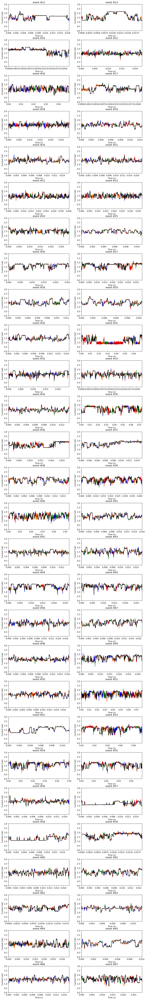

In [8]:
#Splitting individual events into segments initial check###
%matplotlib inline

#fig, axs = plt.subplots(2,3)
x = np.arange(12,68)
#x = np.arange(0,42)
fig=plt.figure(1,clear=True,figsize=(12,120),dpi=200)
#plt.subplot(4,3,1, figure=fig)
for idx, i in enumerate(x):
    plt.subplot(38,2,idx+1)
    #plt.subplot(21,2,idx+1)
    event = longTraps[i]
    #event.parse( parser=SpeedyStatSplit(min_gain_per_sample=1+(event.duration/4), window_width=(event.duration*event.second)/(250*event.duration), 
    #                                    min_width=(event.duration*event.second)/2000)) #for GFP[1]
    #event.parse( parser=SpeedyStatSplit(min_gain_per_sample=0.8*event.duration, window_width=(event.duration*event.second)/(350*event.duration), #0.6*event.duration
    #                                    min_width=(event.duration*event.second)/1000)) #for MBPWT[2] and MBPWT[3]
    event.parse( parser=SpeedyStatSplit(min_gain_per_sample=0.8*event.duration, window_width=(event.duration*event.second)/(350*event.duration), #0.6*event.duration
                                        min_width=20)) #for MBP[0]
    event.plot( color='cycle', alpha=0.66, lines=True)
    #plt.title("GFP Trapping Events")
    plt.ylim(0, 3)#(0, 1.4)#(1, 2.25)#(0, 0.9)
    plt.title(f"event #{i}")
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)


Text(0, 0.5, 'Density')

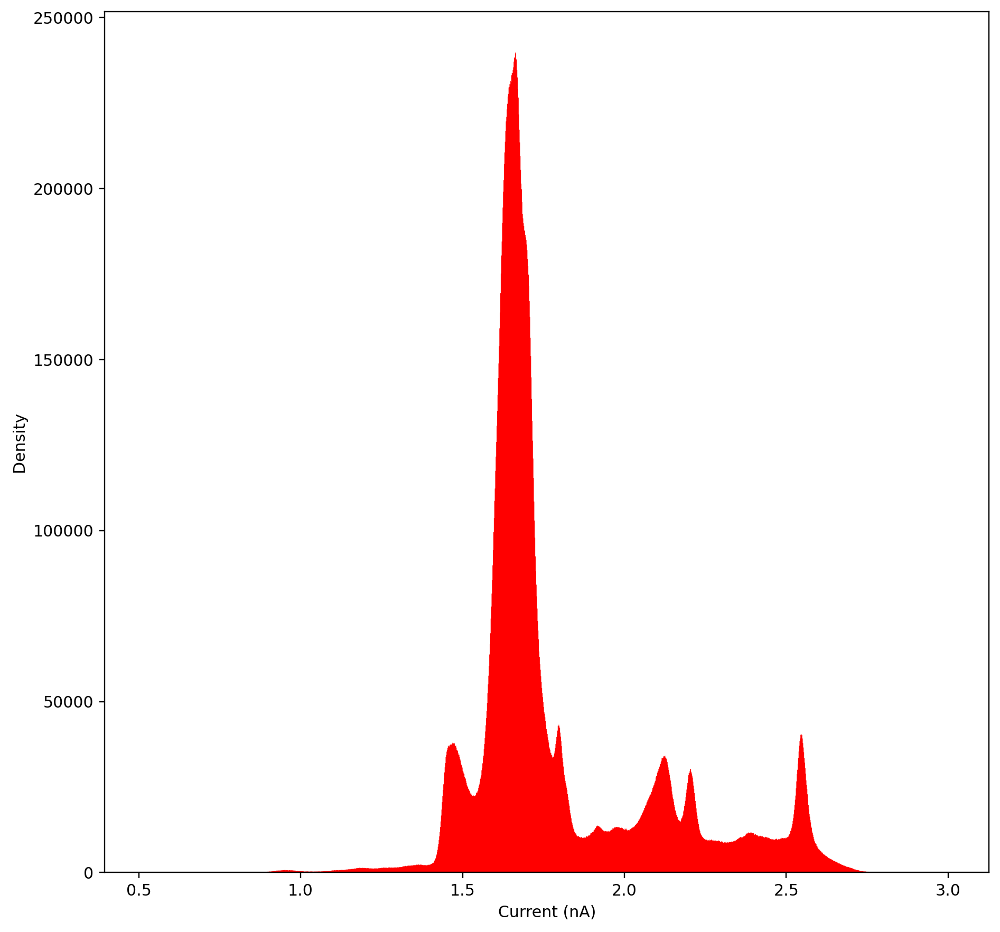

In [70]:
###Histogram of all events in longTraps###

#all_events_current = [event.current for event in file.events]

all_events_current = [event.current for event in longTraps]
combinedCurrents=np.hstack(all_events_current)
plt.figure(figsize=(10,10))
plt.hist(combinedCurrents, bins='auto', histtype = 'stepfilled', color = 'red')
plt.xlabel("Current (nA)")
plt.ylabel("Density")
#plt.savefig('MBP_WT_Histogram.png')


[1.65935436e+00 4.66010902e-02 3.85072620e+06 1.89494385e+00
 4.01629795e-01 3.63960462e+05 2.54703582e+00 1.93663629e-02
 5.28362922e+05]
Mean_1: 1.659
Std_1: 0.047
Mean_2: 1.895
Std_2: 0.402
Mean_3: 2.1
Std_3: 0.019


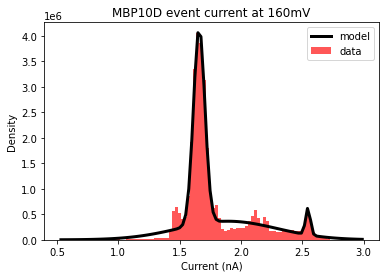

In [95]:
###Finding mean and std of populations with curve fit for WT MBP and GFPWT[1] trapping###
#%matplotlib qt5
from pylab import *
from scipy.optimize import curve_fit

voltage = file.filename[-9:-4]
#data=concatenate((normal(1,.2,5000),normal(2,.2,2500)))
#y,x,_=hist(data,100,alpha=.3,label='data')
y,x,_=hist(combinedCurrents,100,alpha=.66,label='data', color='red')

x=(x[1:]+x[:-1])/2 # for len(x)==len(y)

def gauss(x,mu,sigma,A):
    return A*exp(-(x-mu)**2/2/sigma**2)

def multimodal(x,mu1,sigma1,A1,mu2,sigma2,A2,mu3,sigma3,A3):
    return gauss(x,mu1,sigma1,A1)+gauss(x,mu2,sigma2,A2)+gauss(x,mu3,sigma3,A3)

def bimodal(x,mu1,sigma1,A1,mu2,sigma2,A2):
    return gauss(x,mu1,sigma1,A1)+gauss(x,mu2,sigma2,A2)

#expected=(1,.2,250,2,.2,125)
#expected=(1.5,.4,100, 1.8,.5,125, 2.1,.1,20)
#expected=(2.2,.05,10000,2.3,.1,25000,2.6,.1,12050) #These are the parameters for WT MBP[4] 300mV
#expected=(0.493,.04,190932, 0.95,.04,184709, 1.08,.04,345750) #These are the parameters for WT GFP[4] 150mV
#expected=(1.5,.02,20000, 1.8,.06,84709, 2.1,.02,345750) #These are the parameters for WT MBP[2]
#expected=(2.16,.105,322495, 2.2,.002,100000, 2.34,.023,473916) #These are the parameters for WT MBP[3] 275mV
#expected=(1.6,.02,20000, 1.85,.008,84709) #These are the parameters for WT MBP[1]

#expected=(1.16,.035,259577, 1.79,.013,184709, 1.86,.016,345750) #These are the parameters for MBP10D at 120mV
#expected=(1.31,.035,259577, 1.924,.013,184709, 2.187,.016,345750) #These are the parameters for MBP10D at 140mV
expected=(1.659,.035,3850726, 2.16,4,528358, 2.547,.016,528358) #These are the parameters for MBP10D at 160mV

params,cov=curve_fit(multimodal,x,y,expected)
#params,cov=curve_fit(bimodal,x,y,expected)

sigma=sqrt(diag(cov))

plot(x,multimodal(x,*params),color='black',lw=3,label='model')
#plot(x,bimodal(x,*params),color='black',lw=3,label='model')


plt.xlabel("Current (nA)")
plt.ylabel("Density")
legend()
plt.title(f"MBP10D event current at {voltage}")

print(params)
mean1 = round(params[0],3)
std1 = round(params[1],3)
mean2 = round(params[3],3)
std2 = round(params[4],3)
mean3 = 2.10#round(params[6],3)
std3 = round(params[7],3)
print(f"Mean_1: {mean1}")
print(f"Std_1: {std1}")
print(f"Mean_2: {mean2}")
print(f"Std_2: {std2}")
print(f"Mean_3: {mean3}")
print(f"Std_3: {std3}")

##For 300mV MBPWT###
# mean1 = round(params[0],3)
# std1 = round(params[1],3)
# mean3 = round(params[3],3)
# std3 = round(params[4],3)
# mean2 = round(params[6],3)
# std2 = round(params[7],3)
# print(f"Mean_1: {mean1}")
# print(f"Std_1: {std1}")
# print(f"Mean_2: {mean2}")
# print(f"Std_2: {std2}")
# print(f"Mean_3: {mean3}")
# print(f"Std_3: {std3}")

#print(params,'\n',sigma)    
#pd.DataFrame(data={'params':params,'sigma':sigma},index=bimodal.__code__.co_varnames[1:])

# save_results_to = 'Hiro_Figures/Updated_Figures/MBP_10D_160mV_Figs/'
# plt.savefig(save_results_to + 'Curve_Fit_160mV.png', dpi = 300)
# plt.savefig(save_results_to + 'Curve_Fit_160mV.svg', transparent=True, dpi = 300)   

C:\Users\amrma\OneDrive\Desktop\ProteinData\Hiro\solid_state_ GFPWT_1M_KCl_pH7.5_traces_10kHz filter\Multiple_mV\B072619_006_trace_analysis_110mV.bin
[ 1.73286916e-01 -3.47827285e-02  5.18224953e+04  5.38693676e-01
  3.08722911e-02  4.85820517e+05]
Mean_1: 0.173
Std_1: -0.035
Mean_2: 0.539
Std_2: 0.031


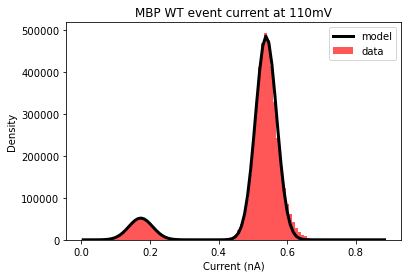

In [224]:
###Finding mean and std of populations with curve fit for WT GFP trapping###

from pylab import *
from scipy.optimize import curve_fit

print(file.filename)
voltage = file.filename[-9:-4]
#data=concatenate((normal(1,.2,5000),normal(2,.2,2500)))
#y,x,_=hist(data,100,alpha=.3,label='data')
y,x,_=hist(combinedCurrents,100,alpha=.66,label='data', color='red')

x=(x[1:]+x[:-1])/2 # for len(x)==len(y)

def gauss(x,mu,sigma,A):
    return A*exp(-(x-mu)**2/2/sigma**2)

def bimodal(x,mu1,sigma1,A1,mu2,sigma2,A2):
    return gauss(x,mu1,sigma1,A1)+gauss(x,mu2,sigma2,A2)

#expected=(1,.2,250,2,.2,125)
#expected=(1.3,.1,2500,1.6,.1,1250) #These are the parameters for WT MBP[0] 200mV
#expected=(1.3,.1,2500,1.55,.1,1250) #These are the parameters for WT MBP[1] 225mV
expected=(0.16,.1,2500,0.55,.1,1250) #These are the parameters for WT GFP[1] 110mV
#expected=(0.2,.1,25000,0.6,.1,12500) #These are the parameters for WT GFP[3] 120mV
params,cov=curve_fit(bimodal,x,y,expected) 
sigma=sqrt(diag(cov))
plot(x,bimodal(x,*params),color='black',lw=3,label='model')
plt.xlabel("Current (nA)")
plt.ylabel("Density")
legend()
plt.title(f"MBP WT event current at {voltage}")
#plt.savefig('GFP_WT_Histogram_Fit.png')

print(params)
mean1 = round(params[0],3)
std1 = round(params[1],3)
mean2 = round(params[3],3)
std2 = round(params[4],3)
print(f"Mean_1: {mean1}")
print(f"Std_1: {std1}")
print(f"Mean_2: {mean2}")
print(f"Std_2: {std2}")
#print(params,'\n',sigma)    
#pd.DataFrame(data={'params':params,'sigma':sigma},index=bimodal.__code__.co_varnames[1:])

# save_results_to = 'Hiro_Figures/Updated_Figures/GFP_WT_120mV_Figs/'
# plt.savefig(save_results_to + 'Historgram_CurveFit_GFP_WT_120mV.png', dpi = 300)
# plt.savefig(save_results_to + 'Historgram_CurveFit_GFP_WT_120mV.svg', transparent=True, dpi = 300)

In [96]:
###Stitching segments together based on how they are binned to approximate the true dwell time###

#Three levels
level_means = [mean1, mean2, mean3]

#Two Levels
#level_means = [mean1, mean2]
#level_stds = [std1, std2]

file.events=longTraps

######################################################
#Deprecated
def stitching(level_segs):
    Stitched_levels = []
    connections = 0
    stitch = [0]
    for idx, seg in enumerate(level_segs):
        if seg != level_segs[-1]:
            if seg[0] == level_segs[idx+1][0] - 1:
                connections += 1
                if connections == 1:
                    stitch = np.concatenate([seg[1],level_segs[idx+1][1]])
                elif connections > 1:
                    stitch = np.concatenate([stitch,level_segs[idx+1][1]])
            elif seg[0] != level_segs[idx+1][0] - 1:
                connections = 0
                if len(stitch) > len(seg[1]):
                    Stitched_levels.append(stitch)
                    #stitched_levels.append(seg[1])
                    stitch = [0]
                else:
                    Stitched_levels.append(seg[1])
                    stitch = [0]
    return Stitched_levels

###############################################################

def stitch_segs(events):
    for event in events:
        tics=[0]
        
        level_type=event.segments[0].level
        levels=[level_type]
        #print(level_type,end="")
        for seg in event.segments:
            if seg.level!=level_type:
                tics.append(int(event.file.second*seg.start))
                level_type=seg.level
                levels.append(level_type)
                #print(level_type,end="")
            #else:
            #    print("-",end="")
        #print(levels)
                
        tics.append(int(event.file.second*event.segments[-1].end)+1)
        
        event.segments=[Segment( current = event.current[ tics[i]+1: tics[i+1]+1 ], start = tics[i],duration=tics[i+1]-tics[i] ,end=tics[i+1],event=event) for i in range( 0, len(tics) - 1)] 
        for level,seg in zip(levels,event.segments):
            seg.scale( float(event.file.second) )
            seg.level = level
            seg.blockage = round((event.I_0-seg.mean)/event.I_0, 4)
            
        #print("")
    return
###############
def binning(seg, level_means):
    if len(level_means) == 3:
        m1 = level_means[0]
        m2 = level_means[1]
        m3 = level_means[2]
        if (seg.mean - m1) < abs(seg.mean - m2) and abs(seg.mean - m1) < abs(seg.mean - m3):
            level_1.append( seg)
            seg.level=1
        elif abs(seg.mean - m2) < abs(seg.mean - m3):
            level_2.append( seg)
            seg.level=2
        else:
            level_3.append( seg)
            seg.level=3
    elif len(level_means) == 2:
        m1 = level_means[0]
        m2 = level_means[1]
        if abs(seg.mean - m1) < abs(seg.mean - m2):
            level_1.append(seg)
            seg.level=1
        else:
            level_2.append(seg)
            seg.level=2
##################    

# def binning(seg, level_means):
#     if len(level_means) == 3:
#         m1 = level_means[0]
#         m2 = level_means[1]
#         m3 = level_means[2]
#         if (seg.mean - m1) < abs(seg.mean - m2) and abs(seg.mean - m1) < abs(seg.mean - m3):
#             level_1.append( seg)
#             seg.level=1
#         elif abs(seg.mean - m2) < abs(seg.mean - m3):
#             level_2.append( seg)
#             seg.level=2
#         else:
#             level_3.append( seg)
#             seg.level=3
#     elif len(level_means) == 2:
#         m1 = level_means[0]
#         m2 = level_means[1]
#         s1 = level_stds[0]
#         s2 = level_stds[1]
#         if seg.mean < m1+1.2*abs(s1):
#             level_1.append(seg)
#             seg.level=1
#         else:
#             level_2.append(seg)
#             seg.level=2
                    

#round((event.I_0-event.mean)/event.I_0, 3)
all_segments_current = []
all_segments_event_idx=[]
for event_idx,event in enumerate(file.events):
    #print(round((event.I_0-event.mean)/event.I_0, 3))
    #event.parse( parser=SpeedyStatSplit(min_gain_per_sample=0.8*event.duration, window_width=(event.duration*event.second)/(350*event.duration), #0.6*event.duration
    #                                    min_width=(event.duration*event.second)/1000)) #for MBPWT[2] and MBPWT[3]
    #event.parse( parser=SpeedyStatSplit(min_gain_per_sample=0.7*event.duration, window_width=(event.duration*event.second)/(450*event.duration), #0.6*event.duration
    #                                    min_width=100 )) #min_width=(event.duration*event.second)/1000)) #All other so far
    #event.parse( parser=SpeedyStatSplit(min_gain_per_sample=0.008, window_width=(event.duration*event.second), 
    #                                    min_width=(event.duration*event.second)/5000)) #Parameters for GFP at 150mV
    event.parse( parser=SpeedyStatSplit(min_gain_per_sample=0.003, window_width=(event.duration*event.second)/(450*event.duration), 
                                        min_width=(10))) #Parameters for MBP10D at 120mV is 0.003 and 10, 0.005 and 20 for 140mV
    for segment in event.segments:
        #print(segment.start, segment.end)
        all_segments_current.append(segment.current)
        all_segments_event_idx.append(event_idx)
    #stitching(event.segments, level_means)

level_1 = []
level_2 = []
level_3 = []

#Stitched_levels = []
for event in file.events:
    for seg in event.segments:
        binning(seg,level_means)
        
stitch_segs(file.events)

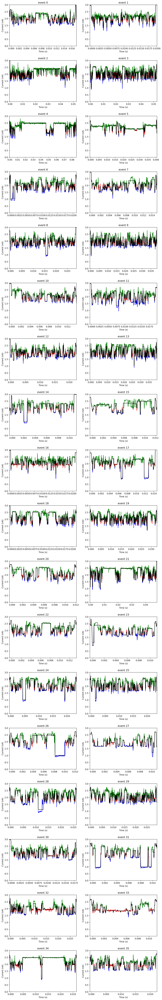

In [100]:
%matplotlib inline
import matplotlib as mpl
#mpl.rcParams['lines.linewidth'] = 0.6
mbp_current=file.current

step=file.second
if len(level_means) == 2:
    colordict={1:"r",2:"g"}
if len(level_means) == 3:
    colordict={1:"b",2:"r",3:"g"}

fig=plt.figure(1,clear=True,figsize=(12,80),dpi=200)
for idx,event in enumerate(file.events[:36]):
    plt.subplot(18,2,idx+1)
    #padding = mbpinfo[i] #Points spanning 1250 sample points before and after the start and end of the event, respectively  
    e_start = int(event.second*(event.start)) #Storing event start in terms of sample point value in file
    e_end = int(event.second*(event.end)) #Storing event end in terms of sample point value in file
    pad_start = int(event.second*(event.start-5e-4))
    pad_end = int(event.second*(event.end+5e-4))
    plt.plot(np.arange(0-len( mbp_current[pad_start:e_start] ), 0)/step, mbp_current[pad_start:e_start], c='k', alpha=1)
    event.plot( color=[colordict[seg.level] for seg in event.segments], alpha=0.66, lines=True)
    plt.plot(np.arange(len(event.current), len(event.current) + len(mbp_current[e_end:pad_end]))/step, mbp_current[e_end:pad_end], c='k', alpha=1)
    plt.title(f"event {idx}")
    plt.ylim(0, 3)#(1.2, 2.3)#(1.2, 2.6)#(1, 2.65)
    plt.xlim((0-len( mbp_current[pad_start:e_start] ))/step, (len(event.current) + len(mbp_current[e_end:pad_end]))/step)
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.2, hspace=0.35)

# save_results_to = 'Hiro_Figures/Updated_Figures/GFP_WT_150mV_Figs/'
# plt.savefig(save_results_to + 'Segmentation_160mV.png', dpi = 300)
# plt.savefig(save_results_to + 'Segmentation_160mV.svg', transparent=True, dpi = 300)

{(1, 2): 0, (1, 3): 0, (2, 1): 0, (2, 3): 0, (3, 1): 0, (3, 2): 0}
{(1, 2): 60508, (1, 3): 19523, (2, 1): 61096, (2, 3): 42665, (3, 1): 18925, (3, 2): 43114}


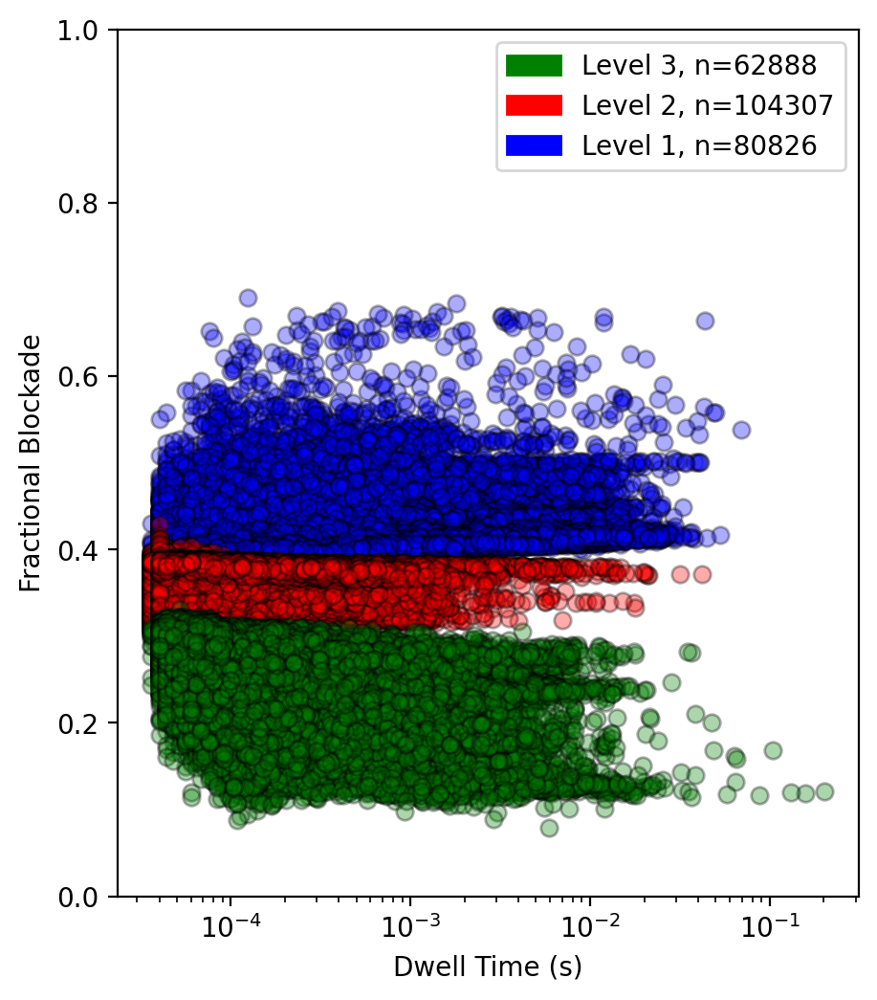

In [101]:
import matplotlib.patches as mpatches
###Permutation of level transitions and the frequency of transitions###
levels_set=set()
for event in file.events:
    for seg in event.segments:
        levels_set.add(seg.level)
    #print (len(event.segments),[seg.level for seg in event.segments])
ts=dict()
for level in levels_set:
    for target in levels_set-{level}:
        ts[(level,target)]=0

print(ts)    

for event in file.events:
    for i,seg in enumerate(event.segments[:-1]):
        level,target=seg.level,event.segments[i+1].level
        ts[level,target]+=1
        
#colordict={1:"b",2:"r",3:"g"}
print(ts)
# print(file.events[0].segments[0])
###################################################################################################################################        
M_1 = []
Std_1 = []
duration_1 = []
blockage_1 = []
FFT_level_1 = []

M_2 = []
Std_2 = []
duration_2 = []
blockage_2 = []
FFT_level_2 = []

M_3 = []
Std_3 = []
duration_3 = []
blockage_3 = []
FFT_level_3 = []

duration_thresh = 0.006 #2500 samples
for event in file.events:
    for seg in event.segments:
        if seg.level == 1 and seg.duration > duration_thresh:
            FFT_level_1.append(seg.current)
        if seg.level == 2 and seg.duration > duration_thresh:
            FFT_level_2.append(seg.current)
        if seg.level == 3 and seg.duration > duration_thresh:
            FFT_level_3.append(seg.current)

for event in file.events:
    for seg in event.segments:
        if seg.level == 1:
            M_1.append(seg.mean)
            Std_1.append(seg.std)
            duration_1.append(seg.duration)
            blockage_1.append(seg.blockage)
        if seg.level == 2:
            M_2.append(seg.mean)
            Std_2.append(seg.std)
            duration_2.append(seg.duration)
            blockage_2.append(seg.blockage)
        if seg.level == 3:
            M_3.append(seg.mean)
            Std_3.append(seg.std)
            duration_3.append(seg.duration)
            blockage_3.append(seg.blockage)

if len(level_means) == 3:            
    plt.figure(figsize=(5,6), dpi=200)
    plt.xscale('log')
    plt.scatter(duration_1, blockage_1, color="blue", edgecolors='k', alpha=0.33, s=40)
    plt.scatter(duration_2, blockage_2, color="red", edgecolors='k', alpha=0.33, s=40)
    plt.scatter(duration_3, blockage_3, color="green", edgecolors='k', alpha=0.33, s=40)
    blue_patch =  mpatches.Patch(color='b', label=f"Level 1, n={len(M_1)}")#label=f"mu: {mean1}")
    red_patch = mpatches.Patch(color='r', label=f"Level 2, n={len(M_2)}")#label=f"mu: {mean2}")
    green_patch = mpatches.Patch(color='g', label=f"Level 3, n={len(M_3)}")#label=f"mu: {mean3}")
    plt.legend(handles=[green_patch, red_patch, blue_patch])
    #plt.legend(handles=[green_patch, red_patch])
    plt.xlabel("Dwell Time (s)")
    plt.ylabel("Fractional Blockade")
    plt.ylim(0,1)

if len(level_means) == 2:            
    plt.figure(figsize=(5,6), dpi=200)
    plt.xscale('log')
    plt.scatter(duration_1, blockage_1, color="red", edgecolors='k', alpha=0.33, s=40)
    plt.scatter(duration_2, blockage_2, color="green", edgecolors='k', alpha=0.33, s=40)
    red_patch = mpatches.Patch(color='r', label=f"Level 2, n={len(M_2)}")#label=f"mu: {mean2}")
    green_patch = mpatches.Patch(color='g', label=f"Level 3, n={len(M_1)}")#label=f"mu: {mean3}")
    plt.legend(handles=[green_patch, red_patch], loc='upper right')
    plt.xlabel("Dwell Time (s)")
    plt.ylabel("Fractional Blockade")
    plt.ylim(0,1)

# save_results_to = 'Hiro_Figures/Updated_Figures/GFP_WT_150mV_Figs/'
# plt.savefig(save_results_to + 'Blockade_vs_Dwell_160mV.png', dpi = 300)
# plt.savefig(save_results_to + 'Blockade_vs_Dwell_160mV.svg', transparent=True, dpi = 300)    

    
#############################################################################################################################################

{(1, 2): 60508, (1, 3): 19523, (2, 1): 61096, (2, 3): 42665, (3, 1): 18925, (3, 2): 43114}


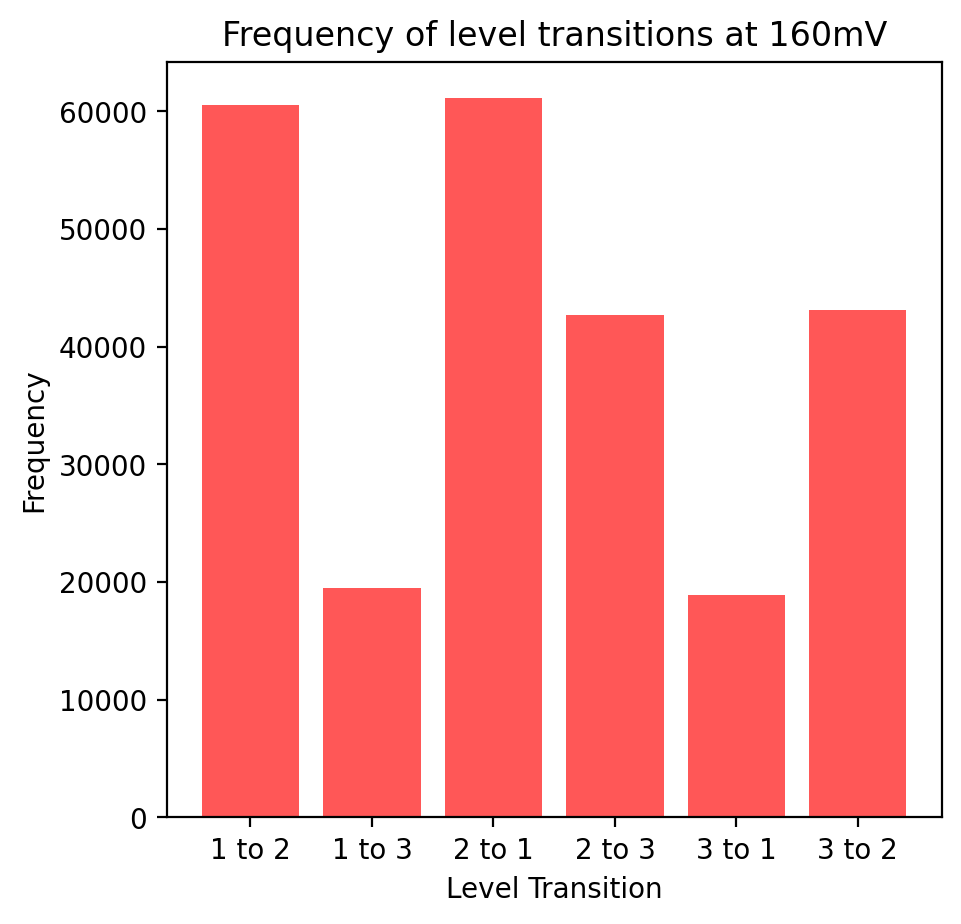

In [102]:
###Frequency Barplot###
print(ts)
keys = list(ts.keys())
values = list(ts.values())
name = ["1 to 2", "1 to 3", "2 to 1", "2 to 3", "3 to 1", "3 to 2"]

plt.figure(figsize=(5,5), dpi=200)
plt.bar(range(len(ts)), values, tick_label=name, color="red", alpha=0.66)
plt.xlabel("Level Transition")
plt.ylabel("Frequency")
plt.title(f"Frequency of level transitions at {voltage}")

# save_results_to = 'Hiro_Figures/Updated_Figures/GFP_WT_150mV_Figs/'
# plt.savefig(save_results_to + 'Transition_Freq_160mV.png', dpi = 300)
# plt.savefig(save_results_to + 'Transition_Freq_160mV.svg', transparent=True, dpi = 300) 



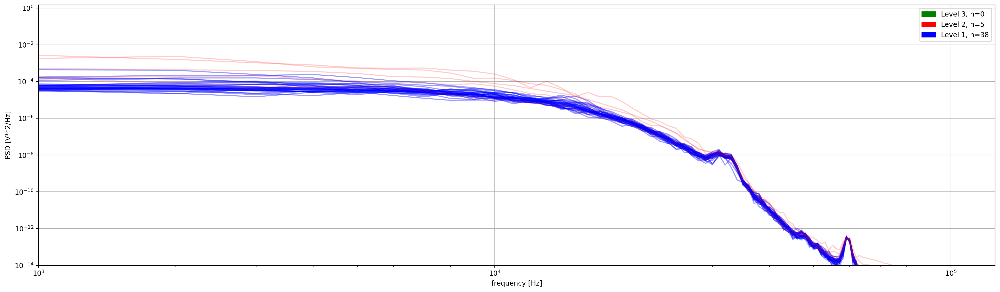

In [122]:
###Taking Fourier Transform of MBP trapping levels###
from scipy import signal
import matplotlib.ticker


plt.figure(figsize=(25,7),dpi=200)

for seg in FFT_level_1:
    spec = signal.welch(seg,fs=250e3, nperseg=250,scaling='spectrum',average='mean')
    #plt.loglog(spec[0], spec[1])
    plt.loglog(spec[0], spec[1],'blue',alpha=0.4)#/(np.max(spec[1])))
    plt.xlim(1000, 125000)
    plt.ylim(1e-14, 1.5)
    #plt.grid()
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [V**2/Hz]')

for seg in FFT_level_2:
    spec = signal.welch(seg,fs=250e3, nperseg=250,scaling='spectrum',average='mean')
    #plt.loglog(spec[0], spec[1])
    plt.loglog(spec[0], spec[1],'red',alpha=0.2)#/(np.max(spec[1])))
    plt.xlim(1000, 125000)
    plt.ylim(1e-14, 1.5)
    #plt.grid()
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [V**2/Hz]')

for seg in FFT_level_3:
    spec = signal.welch(seg,fs=250e3, nperseg=250,scaling='spectrum',average='mean')
    #plt.loglog(spec[0], spec[1])
    #print(len(seg))
    #print(len(spec[0]))
    #print(len(spec[1]))
    plt.loglog(spec[0], spec[1], 'green',alpha=0.4)#/np.max(spec[1]))
    plt.xlim(1000, 125000)
    plt.ylim(1e-14, 1.5)
    #plt.grid()
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [V**2/Hz]')
plt.grid()
plt.tick_params(axis='x', which='minor')

blue_patch =  mpatches.Patch(color='blue', label=f"Level 1, n={len(FFT_level_1)}")#label=f"mu: {mean1}")
red_patch = mpatches.Patch(color='r', label=f"Level 2, n={len(FFT_level_2)}")#label=f"mu: {mean2}")
green_patch = mpatches.Patch(color='g', label=f"Level 3, n={len(FFT_level_3)}")#label=f"mu: {mean3}")
plt.legend(handles=[green_patch, red_patch, blue_patch])

# save_results_to = 'Hiro_Figures/Final_Figures/MBP_WT_250mV_Figs/'
# plt.savefig(save_results_to + 'Updated_Fourier.png', dpi = 300)
# plt.savefig(save_results_to + 'Updated_Fourier.svg', transparent=True, dpi = 300)